# CRQ1

Does the fare for mile change across NY's borough? We want to discover whether the expenses of a user that enjoys Taxis in one zone is different from those that uses it in another one.

Considering the fare amount:
- Compute the price per mile equation for each trip.
- Run the mean and the standard deviation of the new variable for each borough. Then plot the distribution. What do you see?
- Run the t-test among all the possible pairs of distribution of different boroughs.
- Can you say that statistically significant differences, on the averages, hold among zones? In other words, are Taxis trip in some boroughs, on average, more expensive than others?

The price per mile might depend on traffic the Taxi finds on its way. So we try to mitigate this effect:
- Likely, the duration of the trip says something about the city's congestion, especially if combined with the distances. It might be a good idea to weight the price for mile using the time equation needed to complete the trip. Thus, instead of equation, you can use equation, where equation is the time needed to complete the trip.
- Run the mean and the standard deviation of the new variable for each borough. Then plot the distribution. What do you see?
- Run the t-test among all the possible pairs of new distribution of different boroughs.
- Can you say that statistically significant differences, on the averages, hold among zones? In other words, are Taxis trip in some boroughs, on average, more expensive than others?
- Compare the results obtained for the price per mile and the weighted price for mile. What do you think about that?

## Libraries

Let's import all the needed libraries

In [1]:
import pandas as pd
import scipy.stats as stats
from matplotlib import pyplot
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option("display.max_columns",10)

## Datasets

Here we locate all the csvs

In [2]:
Location_Jan = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-01.csv"
Location_Feb = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-02.csv"
Location_Mar = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-03.csv"
Location_Apr = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-04.csv"
Location_May = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-05.csv"
Location_Jun = r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\yellow_tripdata_2018-06.csv"

Load all the datasets

In [3]:
nytaxi = pd.read_csv(Location_Jan, usecols=[1,2,4,7,8,10,16]) 
nytaxi = pd.concat([nytaxi, pd.read_csv(Location_Feb, usecols=[1,2,4,7,8,10,16])])
nytaxi = pd.concat([nytaxi, pd.read_csv(Location_Mar, usecols=[1,2,4,7,8,10,16])])
nytaxi = pd.concat([nytaxi, pd.read_csv(Location_Apr, usecols=[1,2,4,7,8,10,16])])
nytaxi = pd.concat([nytaxi, pd.read_csv(Location_May, usecols=[1,2,4,7,8,10,16])])
nytaxi = pd.concat([nytaxi, pd.read_csv(Location_Jun, usecols=[1,2,4,7,8,10,16])])
nytaxi.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,fare_amount,total_amount
0,2018-01-01 00:21:05,2018-01-01 00:24:23,0.5,41,24,4.5,5.80
1,2018-01-01 00:44:55,2018-01-01 01:03:05,2.7,239,140,14.0,15.30
2,2018-01-01 00:08:26,2018-01-01 00:14:21,0.8,262,141,6.0,8.30
3,2018-01-01 00:20:22,2018-01-01 00:52:51,10.2,140,257,33.5,34.80
4,2018-01-01 00:09:18,2018-01-01 00:27:06,2.5,246,239,12.5,16.55


Now we need to add a new column with the indication of the Borough. We decide to use the pick up location as reference 

In [4]:
Location_2 =r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\taxi_zone_lookup.csv"
nyBorough =pd.read_csv(Location_2, usecols=[0,1])
df_full = nytaxi.join(nyBorough.set_index('LocationID'), on='PULocationID')
df_full.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,fare_amount,total_amount,Borough
0,2018-01-01 00:21:05,2018-01-01 00:24:23,0.5,41,24,4.5,5.80,Manhattan
1,2018-01-01 00:44:55,2018-01-01 01:03:05,2.7,239,140,14.0,15.30,Manhattan
2,2018-01-01 00:08:26,2018-01-01 00:14:21,0.8,262,141,6.0,8.30,Manhattan
3,2018-01-01 00:20:22,2018-01-01 00:52:51,10.2,140,257,33.5,34.80,Manhattan
4,2018-01-01 00:09:18,2018-01-01 00:27:06,2.5,246,239,12.5,16.55,Manhattan


In order to make calculations with dates, we need to convert the column type to 'datetime'

In [5]:
df_full.tpep_pickup_datetime = pd.to_datetime(df_full.tpep_pickup_datetime)
df_full.tpep_dropoff_datetime = pd.to_datetime(df_full.tpep_dropoff_datetime)

We clone the full dataframe to make cleanings on it and keep the original data saved somewhere

In [6]:
df_clean = df_full

## Data exploration

Let's start cleaning up the data.
First thing is to remove all the trips with 'tpep_pickup' < 2017 and > 2019, they probably are errors

In [7]:
df_clean = df_clean[df_clean.tpep_pickup_datetime.dt.year > 2017]
df_clean = df_clean[df_clean.tpep_pickup_datetime.dt.year < 2019]

Let's create a new column 'trip_duration' with the trip duration in seconds, we'll need it later.
We also need to remove all the trips with a duration equal or lower than 0

In [8]:
df_clean['trip_duration'] = (df_clean.tpep_dropoff_datetime - df_clean.tpep_pickup_datetime).dt.total_seconds()
# Remove all the trips with duration null or negative
df_clean = df_clean[df_clean.trip_duration > 0]

According the analysis ran in RQ5, we remove from the dataset all the trips started from the Borough 'EWR'.
Indeed, we discovered that trips from/to the airport have a fixed tariff, and the 'trip_distance' field is kept to 0 by the system

In [9]:
df_clean = df_clean[df_clean.Borough != 'EWR']

Let's check the mean values for all the features by Borough

In [10]:
grouped_mean = df_clean.groupby(['Borough']).mean()
grouped_mean= grouped_mean.drop(columns=['PULocationID','DOLocationID']) # Remove not relevant columns
grouped_mean

,trip_distance,fare_amount,total_amount,trip_duration
Borough,,,,
Bronx,4.641990,18.594937,21.160627,1251.813722
Brooklyn,3.550690,14.476897,17.529345,1070.527834
Manhattan,2.327377,11.174094,14.095019,925.485320
Queens,11.216398,35.189418,44.569400,2178.813162
Staten Island,7.110755,37.360520,47.296968,1440.319307
Unknown,2.614040,15.181959,18.773113,902.464930


The following peculiarities are found:
- Queens has the highest average on 'trip_distance'
- Staten Island has the highest 'fare_amount' average
- Queens has the highest average 'trip_duration'

### 'trip_distance'

It's time to start exploring the data.
Here we check the distribution of the feature 'trip_distance'

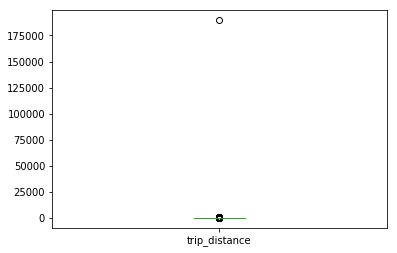

In [11]:
df_clean['trip_distance'].plot.box()

According to RQ5, let's do a first cut at 150

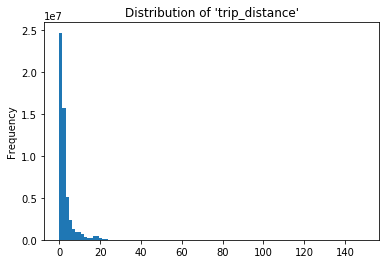

In [12]:
df_clean = df_clean[df_clean.trip_distance < 150]
df_clean['trip_distance'].plot.hist(bins=100, title="Distribution of 'trip_distance'")

Let's investigate Queens 'trip_distance', because it's the borough with the highest mean

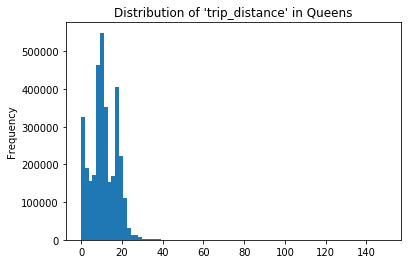

In [13]:
queens = df_clean[df_clean.Borough == "Queens"] # Select all trips from Queens
queens['trip_distance'].plot.hist(bins=80, title="Distribution of 'trip_distance' in Queens")

Analyzing the histogram we decide to cut out all the trips with distance > 35.
This seems a reasonable value to say that trips inside New York hardly cover more than this mileage.
We can also cut out trips with distance less or equal to zero.

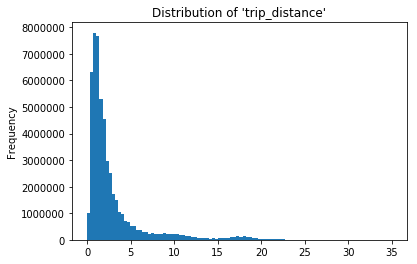

In [14]:
df_clean = df_clean.drop(df_clean[df_clean.trip_distance <= 0].index) # remove rows with trip distance <= 0
df_clean = df_clean.drop(df_clean[df_clean.trip_distance > 35].index) # remove rows with trip distance > 35
df_clean['trip_distance'].plot.hist(bins=100, title="Distribution of 'trip_distance'")

### 'total_amount'

Analysing the NYC Taxi Information document, we found out that there is a minimum fare of 2.5$.
Thus, we can remove trips with 'total_amount' < 2.50 .

In [15]:
df_clean = df_clean.drop(df_clean[df_clean.total_amount < 2.5].index)

### 'fare_amount

Now it's time to investigate the feature 'fare_amount'

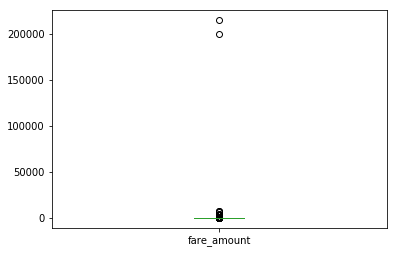

In [16]:
df_clean['fare_amount'].plot.box()

We can clearly see two outliers staind at around 200000. We cut them out together with the values below or equal to zero

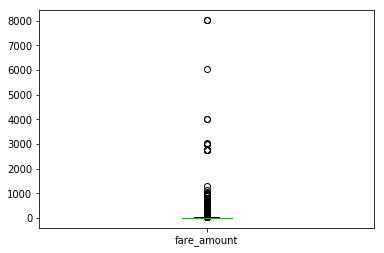

In [17]:
df_clean = df_clean.drop(df_clean[df_clean.fare_amount <= 0].index) # remove rows with fare_amount <= 0
df_clean = df_clean.drop(df_clean[df_clean.fare_amount > 50000].index) # remove rows with fare_amount > 50000
df_clean['fare_amount'].plot.box()

We see other outliers above 2000, we can remove them

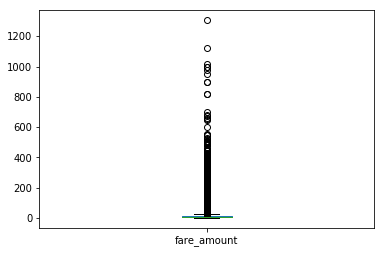

In [18]:
df_clean = df_clean.drop(df_clean[df_clean.fare_amount > 2000].index) # remove rows with fare_amount > 2000
df_clean['fare_amount'].plot.box()

We do another cut at 800

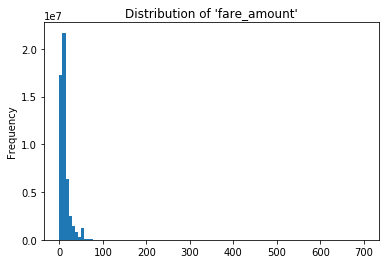

In [19]:
df_clean = df_clean.drop(df_clean[df_clean.fare_amount > 800].index) # remove rows with fare_amount > 800
df_clean['fare_amount'].plot.hist(bins=100, title="Distribution of 'fare_amount'")

The plot is still unbalanced, we do another cut at 150

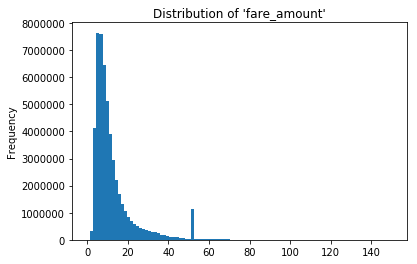

In [20]:
df_clean = df_clean.drop(df_clean[df_clean.fare_amount > 150].index)
df_clean['fare_amount'].plot.hist(bins=100, title="Distribution of 'fare_amount'")

Staten Island is the Borough with the highes fare amount, let's check its distribution

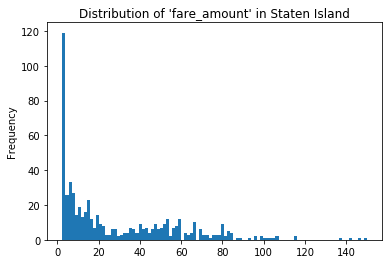

In [21]:
df_clean[df_clean.Borough == 'Staten Island'].fare_amount.plot.hist(bins = 100, title="Distribution of 'fare_amount' in Staten Island")

From this plot we can see that the distribution is almost null after 110.
Thus we can cut there without risking to remove important data

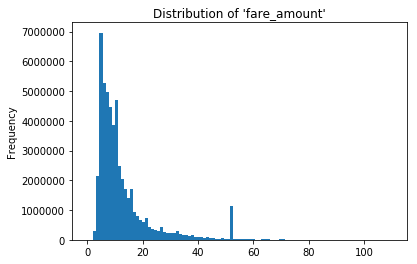

In [22]:
df_clean = df_clean.drop(df_clean[df_clean.fare_amount > 110].index) # remove rows with fare_amount > 110
df_clean['fare_amount'].plot.hist(bins=100, title="Distribution of 'fare_amount'")

### 'trip_duration'

Let's check the feature 'trip_duration'

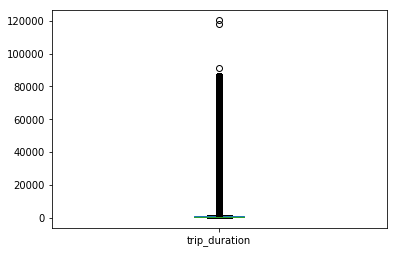

In [23]:
df_clean.trip_duration.plot.box()

There are three outliers, we remove them.
We can remove also trips with 'trip_duration' lower or equal to 60, and > 7500, according to RQ5

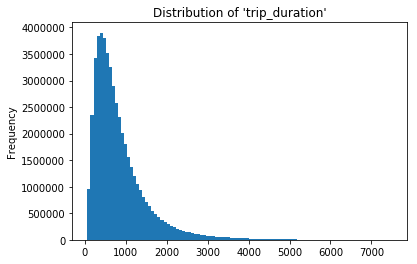

In [24]:
df_clean = df_clean.drop(df_clean[df_clean.trip_duration <= 60].index)
df_clean = df_clean.drop(df_clean[df_clean.trip_duration > 7500].index)
df_clean.trip_duration.plot.hist(bins=100, title="Distribution of 'trip_duration'")

At this point we can consider most of the outliers removed.

### Dealing with 'Unknown' borough

In the dataset we have many rows with 'Unknown' borough.
We want to try to re-allocate the trips to the borough with the closest behaviour.

Let's recalculate the means and the stds for the boroughs.

In [25]:
grouped_mean = df_clean.groupby(['Borough']).mean()
grouped_mean = grouped_mean.drop(columns=['PULocationID','DOLocationID']) # Remove not relevant columns
grouped_mean

,trip_distance,fare_amount,total_amount,trip_duration
Borough,,,,
Bronx,4.943338,18.479040,20.994712,1152.633659
Brooklyn,3.606120,14.406378,17.451541,919.891202
Manhattan,2.333934,11.134969,14.051213,768.281660
Queens,11.357324,35.119793,44.572087,1987.550814
Staten Island,9.864222,32.170519,39.972264,1645.974057
Unknown,2.780328,12.461784,15.714565,830.233314


According to the means, trips from 'Unknown' seems to be similar to the trips from 'Manhattan'.

Let's compare the distributions of the features in these two boroughs in order to have some more valid proof.

In [26]:
unknown = df_clean[df_clean.Borough == "Unknown"] # Select all trips from Unknown
manhattan = df_clean[df_clean.Borough == "Manhattan"] # Select all trips from Manhattan

This is the 'trip_distance' distribution comparison using a normalized histogram.

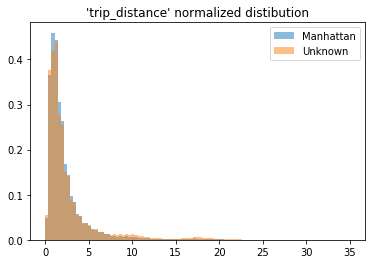

In [27]:
bins = pd.np.linspace(0, 35, 100)

pyplot.hist(manhattan.trip_distance, bins, alpha=0.5, label='Manhattan', density=True)
pyplot.hist(unknown.trip_distance, bins, alpha=0.5, label='Unknown', density=True)
pyplot.legend(loc='upper right')
pyplot.title('\'trip_distance\' normalized distibution')
pyplot.show()

This is the 'trip_duration' distribution comparison using a normalized histogram.

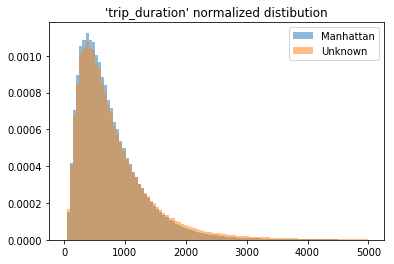

In [28]:
bins = pd.np.linspace(0, 5000, 100)

pyplot.hist(manhattan.trip_duration, bins, alpha=0.5, label='Manhattan', density=True)
pyplot.hist(unknown.trip_duration, bins, alpha=0.5, label='Unknown', density=True)
pyplot.legend(loc='upper right')
pyplot.title('\'trip_duration\' normalized distibution')
pyplot.show()

This is the 'fare_amount' distribution comparison using a normalized histogram.

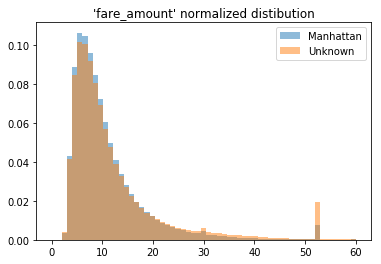

In [29]:
bins = pd.np.linspace(0, 60, 60)

pyplot.hist(manhattan.fare_amount, bins, alpha=0.5, label='Manhattan', density=True)
pyplot.hist(unknown.fare_amount, bins, alpha=0.5, label='Unknown', density=True)
pyplot.legend(loc='upper right')
pyplot.title('\'fare_amount\' normalized distibution')
pyplot.show()

In all the three previouses plots, the features showed pratically the same trend between 'Unknown' and 'Manhattan'.

But, just to be sure, we decide to run also t-tests between the two sets.

In this case:
- H0: the boroughs are statistically the same
- H1: the boroughs are statistically different

In [30]:
stats.ttest_ind(manhattan['trip_distance'], unknown['trip_distance'])

Ttest_indResult(statistic=-144.16823027745616, pvalue=0.0)

In [31]:
stats.ttest_ind(manhattan['trip_duration'], unknown['trip_duration'])

Ttest_indResult(statistic=-93.21107046624724, pvalue=0.0)

In [32]:
stats.ttest_ind(manhattan['fare_amount'], unknown['fare_amount'])

Ttest_indResult(statistic=-139.08085026483243, pvalue=0.0)

Contrary than expected, we found no statistic evidence that 'Unknown' and 'Manhattan' are correlated, because p-value is 0 in all the tests.

Thus, we remove all the trips coming from Unknown borough.

In [33]:
df_clean = df_clean.drop(df_clean[df_clean.Borough == 'Unknown'].index)

At this point we can consider the dataset (mostly) clean and we can proceed with the analysis asked in CRQ1.

## Does the fare for mile change across NY's borough?

In order to give an answer, we firstly need to create a new column called 'price_per_mile', filled with the ratio between the trip 'fare_amount' and 'trip_distance'.

In [34]:
df_clean['price_per_mile'] = df_clean.fare_amount / df_clean.trip_distance

Let's check the distribution of the new 'price_per_mile' feature

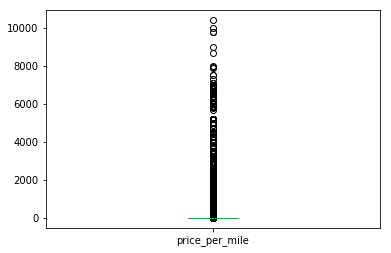

In [35]:
df_clean.price_per_mile.plot.box()

There are some outliers. We'll cut out all the trips with a too high and too low 'price_per_mile'

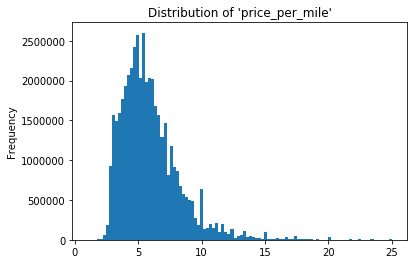

In [36]:
df_clean = df_clean.drop(df_clean[df_clean.price_per_mile > 25].index) # remove rows with 'price_per_mile' > 25
df_clean = df_clean.drop(df_clean[df_clean.price_per_mile < 1].index) # remove rows with 'price_per_mile' < 1

df_clean.price_per_mile.plot.hist(bins=100, title="Distribution of 'price_per_mile'")

Now that outliers are removed, we can recalculate the mean and the std for all the features.

In [37]:
grouped_mean = df_clean.groupby(['Borough']).mean()
grouped_mean = grouped_mean.drop(columns=['PULocationID','DOLocationID'])
grouped_mean

,trip_distance,fare_amount,total_amount,trip_duration,price_per_mile
Borough,,,,,
Bronx,4.969710,18.504370,21.015206,1157.285649,4.891433
Brooklyn,3.614219,14.400909,17.446006,921.868574,5.037794
Manhattan,2.338309,11.133985,14.050368,769.120526,6.124669
Queens,11.381281,35.125709,44.583295,1991.674115,3.479249
Staten Island,10.122559,32.761880,40.534491,1666.169713,4.075948


In [38]:
grouped_std = df_clean.groupby(['Borough']).std()
grouped_std = grouped_std.drop(columns=['PULocationID','DOLocationID'])
grouped_std

,trip_distance,fare_amount,total_amount,trip_duration,price_per_mile
Borough,,,,,
Bronx,5.051806,15.014129,16.943048,966.735605,2.143410
Brooklyn,3.473833,10.472007,12.015046,697.747479,1.973487
Manhattan,2.623884,8.062498,10.094337,564.879108,2.349780
Queens,5.928868,15.574336,19.985980,1079.712053,1.368341
Staten Island,8.803162,25.771779,33.173673,1393.855245,1.945871


And if we plot the distributions of the various boroughs:

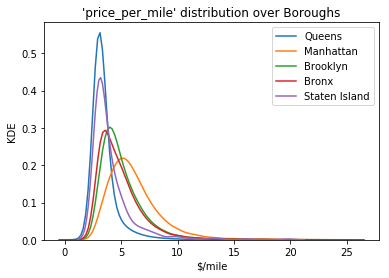

In [39]:
sns.kdeplot(df_clean.price_per_mile[df_clean.Borough == "Queens"],label='Queens', bw=0.5)
sns.kdeplot(df_clean.price_per_mile[df_clean.Borough == "Manhattan"],label='Manhattan', bw=0.5)
sns.kdeplot(df_clean.price_per_mile[df_clean.Borough == "Brooklyn"],label='Brooklyn', bw=0.5)
sns.kdeplot(df_clean.price_per_mile[df_clean.Borough == "Bronx"],label='Bronx', bw=0.5)
sns.kdeplot(df_clean.price_per_mile[df_clean.Borough == "Staten Island"],label='Staten Island', bw=0.5)

plt.xlabel('$/mile')
plt.ylabel('KDE')
plt.title('\'price_per_mile\' distribution over Boroughs')
plt.show()

Let's do a t-test on the 'price_per_mile' series
- H0: means are the same
- H1: means are different

Our p-value treshold is p-value = 0.05

In [40]:
ttest_matrix = pd.DataFrame(index=df_clean.Borough.unique(), columns=df_clean.Borough.unique())

for col1 in df_clean.Borough.unique():
    for col2 in df_clean.Borough.unique():
        ttest_matrix.loc[col1,col2] = stats.ttest_ind(df_clean[df_clean.Borough == col1]['price_per_mile'], df_clean[df_clean.Borough == col2]['price_per_mile']).pvalue
        if col1==col2:
            break
            
ttest_matrix = ttest_matrix.apply(pd.to_numeric)
ttest_matrix

,Manhattan,Brooklyn,Queens,Bronx,Staten Island
Manhattan,1.000000e+00,NaN,NaN,NaN,NaN
Brooklyn,0.000000e+00,1.000000e+00,NaN,NaN,NaN
Queens,0.000000e+00,0.000000e+00,1.000000e+00,NaN,NaN
Bronx,0.000000e+00,1.114447e-49,0.000000e+00,1.000000e+00,NaN
Staten Island,2.802836e-65,1.501380e-21,1.427226e-17,1.202316e-13,1.0


We consider pvalue = 0.05 as a treshold to reject the H0.
Pvalues higher than 0.05 mean that Boroughs have the same mean (we accept the H0)
Pvalues lower than 0.05 mean that Boroughs have different mean (we reject the H0)

H0 is rejected for all the pairs.

Second part of CRQ1 asks us to adjust the price per mile taking in account the traffic.

This is done creating a new feature dividing 'price_per_mile' by 'trip_duration.

We create a new column with 'ppm_adj' with the adjusted price per mile.

In [41]:
df_clean['ppm_adj'] = df_clean.fare_amount/df_clean.trip_duration

df_clean.head()

,tpep_pickup_datetime,tpep_dropoff_datetime,trip_distance,PULocationID,DOLocationID,...,total_amount,Borough,trip_duration,price_per_mile,ppm_adj
2,2018-01-01 00:08:26,2018-01-01 00:14:21,0.8,262,141,...,8.30,Manhattan,355.0,7.500000,0.016901
8,2018-01-01 00:56:38,2018-01-01 01:01:05,1.0,238,24,...,8.50,Manhattan,267.0,5.500000,0.020599
9,2018-01-01 00:17:04,2018-01-01 00:22:24,0.7,170,170,...,6.80,Manhattan,320.0,7.857143,0.017188
10,2018-01-01 00:41:03,2018-01-01 00:46:49,0.6,162,229,...,8.15,Manhattan,346.0,9.166667,0.015896
11,2018-01-01 00:52:54,2018-01-01 01:17:33,3.5,141,113,...,17.80,Manhattan,1479.0,4.714286,0.011156


Let's plot the distribution of the new feature for each borough

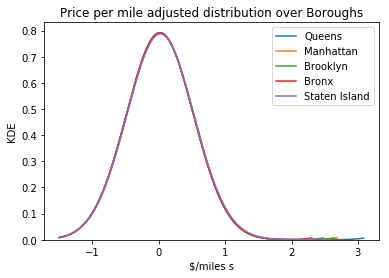

In [42]:
sns.kdeplot(df_clean.ppm_adj[df_clean.Borough == "Queens"],label='Queens', bw=0.5)
sns.kdeplot(df_clean.ppm_adj[df_clean.Borough == "Manhattan"],label='Manhattan', bw=0.5)
sns.kdeplot(df_clean.ppm_adj[df_clean.Borough == "Brooklyn"],label='Brooklyn', bw=0.5)
sns.kdeplot(df_clean.ppm_adj[df_clean.Borough == "Bronx"],label='Bronx', bw=0.5)
sns.kdeplot(df_clean.ppm_adj[df_clean.Borough == "Staten Island"],label='Staten Island', bw=0.5)

# beautifying the labels
plt.xlabel('$/miles s')
plt.ylabel('KDE')
plt.title('Price per mile adjusted distribution over Boroughs')
plt.show()

Now we can update the table with mean and std by borough adding the new columns

In [43]:
grouped_mean = df_clean.groupby(['Borough']).mean()
grouped_mean = grouped_mean.drop(columns=['PULocationID','DOLocationID'])
grouped_mean

,trip_distance,fare_amount,total_amount,trip_duration,price_per_mile,ppm_adj
Borough,,,,,,
Bronx,4.969710,18.504370,21.015206,1157.285649,4.891433,0.017555
Brooklyn,3.614219,14.400909,17.446006,921.868574,5.037794,0.017006
Manhattan,2.338309,11.133985,14.050368,769.120526,6.124669,0.015987
Queens,11.381281,35.125709,44.583295,1991.674115,3.479249,0.019330
Staten Island,10.122559,32.761880,40.534491,1666.169713,4.075948,0.027051


In [44]:
grouped_std = df_clean.groupby(['Borough']).std()
grouped_std = grouped_std.drop(columns=['PULocationID','DOLocationID'])
grouped_std

,trip_distance,fare_amount,total_amount,trip_duration,price_per_mile,ppm_adj
Borough,,,,,,
Bronx,5.051806,15.014129,16.943048,966.735605,2.143410,0.009617
Brooklyn,3.473833,10.472007,12.015046,697.747479,1.973487,0.007016
Manhattan,2.623884,8.062498,10.094337,564.879108,2.349780,0.005038
Queens,5.928868,15.574336,19.985980,1079.712053,1.368341,0.009311
Staten Island,8.803162,25.771779,33.173673,1393.855245,1.945871,0.066118


Finally, we can perform a t-test over the new feature.

- H0: means are the same
- H1: means are different

P-value treshold is still pvalue = 0.05

In [45]:
ttest_matrix_adj = pd.DataFrame(index=df_clean.Borough.unique(), columns=df_clean.Borough.unique())

for col1 in df_clean.Borough.unique():
    for col2 in df_clean.Borough.unique():
        ttest_matrix_adj.loc[col1,col2] = stats.ttest_ind(df_clean[df_clean.Borough == col1]['ppm_adj'], df_clean[df_clean.Borough == col2]['ppm_adj']).pvalue
        if col1==col2:
            break

ttest_matrix_adj = ttest_matrix_adj.apply(pd.to_numeric)
ttest_matrix_adj    

,Manhattan,Brooklyn,Queens,Bronx,Staten Island
Manhattan,1.0,NaN,NaN,NaN,NaN
Brooklyn,0.0,1.000000e+00,NaN,NaN,NaN
Queens,0.0,0.000000e+00,1.000000e+00,NaN,NaN
Bronx,0.0,1.028585e-52,0.000000e+00,1.000000e+00,NaN
Staten Island,0.0,4.127095e-163,8.041150e-59,3.732639e-59,1.0


We consider pvalue = 0.05 as a treshold to reject the H0.
Pvalues higher than 0.05 mean that Boroughs have the same mean (we accept the H0)
Pvalues lower than 0.05 mean that Boroughs have different mean (we reject the H0)

It happened that, again, all the boroughs have different means, so there are boroughs more expensive than others

# CRQ2

Visualize Taxis movements! NYC is divided in many Taxis zones. For each yellow cab trip we know the zone the Taxi pick up and drop off the users. Let's visualize, on a chropleth map, the number of trips that starts in each zone. Than, do another map to count the races that end up in the single zone. Comment your discoveries.

## Libraries
Let's start importing libraries

In [46]:
import folium as folium
from IPython.display import HTML

## Data preparation

Now we create two dataframes, one for the pickup and one for the drop off, with the count of the trips referring a specific zone

In [47]:
df_grouped_pu = df_clean.groupby(['PULocationID']).count()
df_grouped_pu = df_grouped_pu['Borough']
df_grouped_pu.rename = ['count']
df_grouped_pu.head()

PULocationID
2        24
3       365
4    100863
5         6
6        64
Name: Borough, dtype: int64

In [48]:
df_grouped_do = df_clean.groupby(['DOLocationID']).count()
df_grouped_do = df_grouped_do['Borough']
df_grouped_do.head()

DOLocationID
1     79771
2        19
3      2999
4    220422
5       273
Name: Borough, dtype: int64

## Choropleth map

We'll show this data on a choropleth map using Folium.

### Map of the pick up zones

In [49]:
ny_json= r"C:\Users\mikyl\Documents\GitHub\ADM-HW2-Group-3\data\taxi_zones.json"

taxiMap_pu = folium.Map(location=[40.7142700,-74.0059700], zoom_start=10)

taxiMap_pu.choropleth(geo_data=ny_json,
                     fill_color='YlGn', fill_opacity=0.8, line_opacity=0.5,
                     data = df_grouped_pu,
                     key_on='feature.properties.LocationID',
                     columns = [df_grouped_pu.index,'count'],
                     legend_name = 'Taxis trips'
                     )
folium.LayerControl().add_to(taxiMap_pu)

taxiMap_pu

### Map of the drop off zones

In [51]:
taxiMap_do = folium.Map(location=[40.7142700,-74.0059700], zoom_start=10)

taxiMap_do.choropleth(geo_data=ny_json,
                     fill_color='YlGn', fill_opacity=0.8, line_opacity=0.5,
                     data = df_grouped_do,
                     key_on='feature.properties.LocationID',
                     columns = [df_grouped_do.index,'count'],
                     legend_name = 'Taxis trips'
                     )
taxiMap_do

## Considerations

We can see that there are some specific zones of the city that stands out compared to other zones.

In both maps:
- Zones around Central Park in Manhattan
- Governor Island, Libery Island and Ellis Island in Manhattan
- Fershkills Park in Staten Island
- Great Kills Park in State Island
- JFK Airport in Queens
- LaGuardia Airport in Queens

In the pick up map a couple of zones have a very high number of trips associated:
- New Dorp in Staten Island
- Crotona Park in Bronx

Many of the trips start or end in a park. It's a strong trend, that can be associated to tourists or to residents that want to spend some time at the open air.

The trips involving Governo Island, Liberty Island, Ellis Island and the two airports (JFK and LaGuardia) should be accounted mostly to the tourists.

New Dorp instead, seems to be a residential borough, full of commercial activities. Thus, probably people take a taxi from there because they need to go to work or because they just finished shopping and they are full of bags.

Zones around central park are full of offices, and this could be the reason of the high number of trips starting and ending there.

## Further analysis

In order to better understand these trends, let's analyze the pick up zone and drop off zone together.

We create a new column with a string containing the pick up zone and the drop off zone. Then we group by this new feature, and count the occurrencies.

In the end, we plot the 10 most frequent trips.

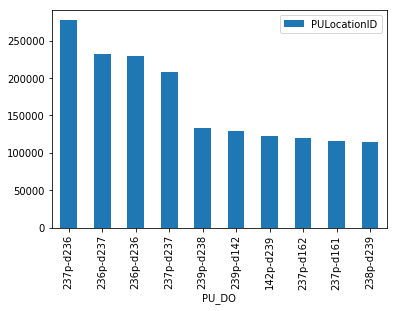

In [55]:
df_clean['PU_DO'] = df_clean["PULocationID"].map(str).add('p-d').add(df_clean["DOLocationID"].map(str))

df_pudo = df_clean.groupby(['PU_DO']).count()
df_pudo = df_pudo[['PULocationID']]
df_pudo = df_pudo.sort_values(by='PULocationID', ascending=False)

df_pudo[0:10].plot.bar()

### Upper East Side in Manhattan

The most common trips involve zones 236 and 237. These are the codes respectively for Upper East Side North and Upper East Side South in Manhattan.

Upper East Side, according to Wikipedia, is one of the most affluent neighborhoods in New York. It is full of offices, libraries but also full of attractions, like museums (Guggenheim above all) consulates.

Seems that in the Upper East Side, it's common to take the cab for very short trips.

### Upper West Side and Lincoln Square

Zones 238 and 239 refers to the Upper West Side, in Manhattan. This borough is geographically very close to the Upper East Side (it's just on the other side of Central Park).

Also, a lot of trips are between Upper West Side and Lincoln Square (142). There two neighborhoods are adiacent, and reflect the same behaviour of the Upper East Side, but with less volumes.

### Midtown 

Also in the top 10, there are trips between Upper East Side and Midtown (161 and 162). Midtown is right in the south of the Upper East Side, and it's something more than a short walk distance.

Midtown combines work activities and touristic activities. It is the neighborhood of the skyscrapers, but also Time Square, Madison Square Garden and Plaza Hotel, very touristic points of interest.

## Conclusions

In the end, trips starting and ending in Manhattan are the most common. Appears that the taxi is cheap enough to cover also small distances. This conclusion could be already reached comparing the 'trip_distance' mean values of the various boroughs, Mahattan has the lowest one indeed (mean: 2.33, sts: 2,62). 

Let's remember we removed all the trips lasting less than 60 seconds. After this last analysis, we can say that probably was not a good idea referring to Manhattan. A specific analysis on this borough could lead to different cleaning actions.